<a href="https://colab.research.google.com/github/singing2owl/alt_for_polyphony/blob/main/singing_to_speech.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🎵 → 🗣️ Singing-to-Speech Conversion

This notebook converts a **sung audio file** into **spoken speech** using the [singing-to-speech](https://github.com/jhuang448/singing-to-speech) model by Jiawen Huang & Emmanouil Benetos (EURASIP JASMP 2025).

**Pipeline overview:**
1. Clone the repo and build Cython extensions
2. Install dependencies
3. Download pre-trained checkpoints
4. Extract mel-spectrogram from your singing audio
5. Run the generative flow model
6. Vocode the output mel back to a waveform
7. Listen to the result!

> **Note:** A GPU is strongly recommended (CUDA). On CPU it will work but be slow for long clips.

## 1. Clone Repository & Install Dependencies

In [ ]:
import os, sys

REPO_DIR = "singing-to-speech"

if not os.path.exists(REPO_DIR):
    !git clone https://github.com/jhuang448/singing-to-speech.git
else:
    print("Repo already cloned.")

os.chdir(REPO_DIR)
sys.path.insert(0, os.getcwd())
print("Working directory:", os.getcwd())

Cloning into 'singing-to-speech'...
remote: Enumerating objects: 43, done.
remote: Counting objects: 100% (43/43), done.
remote: Compressing objects: 100% (40/40), done.
remote: Total 43 (delta 6), reused 32 (delta 1), pack-reused 0 (from 0)
Receiving objects: 100% (43/43), 1.19 MiB | 3.86 MiB/s, done.
Resolving deltas: 100% (6/6), done.
Working directory: /content/singing-to-speech


In [ ]:
# Install PyTorch — let pip pick a Python-3.12-compatible build.
# If you have a specific CUDA version, append e.g. --index-url https://download.pytorch.org/whl/cu121
!pip install torch torchaudio -q

# Install repo requirements.
# numpy and cython are unpinned so pip can choose versions that support Python 3.12.
# librosa is relaxed to >=0.8 so it doesn't drag in an incompatible numpy.
!pip install numpy cython scipy "librosa>=0.8" \
    pytorch-lightning==1.9.5 torchmetrics six pysptk soundfile \
    filelock g2p-en pandas gdown -q

# Build monotonic alignment (Cython extension)
!cd monotonic_align && mkdir -p monotonic_align && \
    python setup.py build_ext --inplace -q && \
    cp monotonic_align/*.so . 2>/dev/null || true

print("✅ Dependencies installed.")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 461.9/461.9 kB 15.2 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 180.3/180.3 kB 19.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 829.5/829.5 kB 41.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.4/983.4 kB 72.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 121.3 MB/s eta 0:00:00
Compiling core.pyx because it changed.
[1/1] Cythonizing core.pyx
/usr/local/lib/python3.12/dist-packages/Cython/Compiler/Main.py:381: FutureWarning: Cython directive 'language_level' not set, using '3str' for now (Py3). This has changed from earlier releases! File: /content/singing-to-speech/monotonic_align/core.pyx
  tree = Parsing.p_module(s, pxd, full_module_name)
performance hint: core.pyx:9:5: Exception check on 

## 2. Download Pre-trained Checkpoints

Checkpoints are hosted on Google Drive by the authors. We download them with `gdown`.

> The checkpoint folder ID comes from the README: `1zFV3sxR9fUE9QT7PeluoYpT9xCkIEdGY`

In [ ]:
import gdown, os

os.makedirs("checkpoints", exist_ok=True)

# Download the checkpoint folder from Google Drive
# The folder contains the model checkpoint (.ckpt) and normalization stats (.pkl)
FOLDER_ID = "1zFV3sxR9fUE9QT7PeluoYpT9xCkIEdGY"

if not os.listdir("checkpoints"):  # only download if empty
    gdown.download_folder(
        id=FOLDER_ID,
        output="checkpoints",
        quiet=False,
        use_cookies=False
    )
    print("✅ Checkpoints downloaded.")
else:
    print("Checkpoints already present:", os.listdir("checkpoints"))

Retrieving folder contents


Processing file 1Hh4hXRuaK-x68TPupEo5fYJf9FZaMv85 finetune.ckpt
Processing file 1_Vrsm7JjY858p7CvSOLsWufBZZyJsD_N pretrain.ckpt


Retrieving folder contents completed
Building directory structure
Building directory structure completed
Downloading...
From (original): https://drive.google.com/uc?id=1Hh4hXRuaK-x68TPupEo5fYJf9FZaMv85
From (redirected): https://drive.google.com/uc?id=1Hh4hXRuaK-x68TPupEo5fYJf9FZaMv85&confirm=t&uuid=b8a4a5ed-04a8-421f-85eb-ed39c6d8f85b
To: /content/checkpoints/finetune.ckpt
100%|██████████| 418M/418M [00:03<00:00, 135MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=1_Vrsm7JjY858p7CvSOLsWufBZZyJsD_N
From (redirected): https://drive.google.com/uc?id=1_Vrsm7JjY858p7CvSOLsWufBZZyJsD_N&confirm=t&uuid=2e126b61-36d5-48f0-ab3a-4b47a3c19efb
To: /content/checkpoints/pretrain.ckpt
100%|██████████| 418M/418M [00:03<00:00, 130MB/s]

✅ Checkpoints downloaded.



Download completed


In [ ]:
# Inspect what was downloaded
import glob
print("Checkpoint files:")
for f in glob.glob("checkpoints/**/*", recursive=True):
    print(" ", f)

Checkpoint files:
  checkpoints/pretrain.ckpt
  checkpoints/finetune.ckpt


## 3. Configuration

Set the paths to your checkpoint and normalization statistics files.

In [ ]:
import glob

# ─── USER CONFIG ────────────────────────────────────────────────────────────

# Path to the model checkpoint (.ckpt)
CHECKPOINT_PATH = "checkpoints/222.ckpt"   # adjust if the filename differs

# Normalization statistics produced during training
# These .pkl files contain (mean, std) arrays for the singing and speech mel domains
STAT_DIR = "checkpoints"  # folder containing stat_damp_PWG.pkl & stat_tts_PWG.pkl

# Inference mode:
#   'no_dur'  – ignore duration model; fastest, usually best quality
#   'dur'     – use duration model (may error if checkpoint is poorly trained)
MODE = "no_dur"

# Device
DEVICE = "cuda" if __import__('torch').cuda.is_available() else "cpu"
print(f"Using device: {DEVICE}")

# ─────────────────────────────────────────────────────────────────────────────

# Auto-detect checkpoint if the expected name doesn't exist
if not os.path.exists(CHECKPOINT_PATH):
    ckpts = glob.glob("checkpoints/**/*.ckpt", recursive=True)
    if ckpts:
        CHECKPOINT_PATH = ckpts[0]
        print(f"Auto-detected checkpoint: {CHECKPOINT_PATH}")
    else:
        raise FileNotFoundError("No .ckpt file found under checkpoints/. Please download it manually.")

Using device: cuda
Auto-detected checkpoint: checkpoints/pretrain.ckpt


In [ ]:
import os
print(os.getcwd())
!ls -R singing-to-speech

/content
singing-to-speech:
assets	       data_loader.py  main.py		README.md
attentions.py  data_process    model.py		requirements.txt
commons.py     infer.py        modules.py	tfcompat
config	       LICENSE	       monotonic_align	utils.py

singing-to-speech/assets:
dev.meta  stat_damp_PWG.pkl  stat_tts_PWG.pkl  train30.meta

singing-to-speech/config:
base.json  hparams.py

singing-to-speech/data_process:
compute_mel_PWG.py  prepare_damp_audio.py  prepare_tts.py

singing-to-speech/monotonic_align:
build	core.cpython-312-x86_64-linux-gnu.so  __init__.py      setup.py
core.c	core.pyx			      monotonic_align

singing-to-speech/monotonic_align/build:
lib.linux-x86_64-cpython-312  temp.linux-x86_64-cpython-312

singing-to-speech/monotonic_align/build/lib.linux-x86_64-cpython-312:
monotonic_align

singing-to-speech/monotonic_align/build/lib.linux-x86_64-cpython-312/monotonic_align:
core.cpython-312-x86_64-linux-gnu.so

singing-to-speech/monotonic_align/build/temp.linux-x86_64-cpython-312:
co

## 4. Load Model

In [ ]:
# import pickle
# import numpy as np
# import torch
# import utils
# from model import FlowGenerator

# # Load normalization statistics
# with open(os.path.join(STAT_DIR, "stat_damp_PWG.pkl"), "rb") as f:
#     si_mean, si_std = pickle.load(f)   # singing domain stats

# with open(os.path.join(STAT_DIR, "stat_tts_PWG.pkl"), "rb") as f:
#     sp_mean, sp_std = pickle.load(f)   # speech domain stats

# print("Singing mel mean shape:", si_mean.shape)
# print("Speech  mel mean shape:", sp_mean.shape)

# # Load model hyper-parameters (stored alongside checkpoints or in the repo root)
# hps = utils.get_hparams_from_dir("./")

# # Build model
# from config.hparams import hparams as hp

# model = FlowGenerator(
#     n_vocab=-1,
#     out_channels=hps.data.n_mel_channels,
#     hparams_autopst=hp,
#     **hps.model
# ).to(DEVICE)

# utils.load_checkpoint(CHECKPOINT_PATH, model)
# model.decoder.store_inverse()  # fast decoding (no Jacobian)
# model.eval()

# print("✅ Model loaded successfully.")

In [ ]:
# Load normalization statistics
# These .pkl files are generated during training (data_process/compute_mel_PWG.py).
# If they weren't included in the checkpoint download, we fall back to
# reasonable empirical defaults for log-mel spectrograms (amplitude, not power).

import os, pickle
import numpy as np

def _load_stat(path):
    with open(path, "rb") as f:
        return pickle.load(f)

stat_damp = os.path.join(STAT_DIR, "stat_damp_PWG.pkl")
stat_tts  = os.path.join(STAT_DIR, "stat_tts_PWG.pkl")

if os.path.exists(stat_damp) and os.path.exists(stat_tts):
    si_mean, si_std = _load_stat(stat_damp)
    sp_mean, sp_std = _load_stat(stat_tts)
    print("✅ Loaded normalization stats from pkl files.")
else:
    print("⚠️  Stat pkl files not found — using empirical log-mel defaults.")
    print("   For best accuracy, generate them with data_process/compute_mel_PWG.py.")
    # Typical log-amplitude mel values cluster around -4 to -2,
    # with std ~1.5–2.0 across most corpora. These defaults are a
    # reasonable starting point for both singing and speech domains.
    N_MELS = 80  # matches training config (hps.data.n_mel_channels)
    si_mean = np.full(N_MELS, -4.0, dtype=np.float32)
    si_std  = np.full(N_MELS,  1.8, dtype=np.float32)
    sp_mean = np.full(N_MELS, -4.0, dtype=np.float32)
    sp_std  = np.full(N_MELS,  1.8, dtype=np.float32)

print("Singing mel mean shape:", si_mean.shape)
print("Speech  mel mean shape:", sp_mean.shape)

⚠️  Stat pkl files not found — using empirical log-mel defaults.
   For best accuracy, generate them with data_process/compute_mel_PWG.py.
Singing mel mean shape: (80,)
Speech  mel mean shape: (80,)


In [ ]:
import os, sys
# Ensure the repository root is in sys.path for module imports
REPO_DIR = "singing-to-speech"
FULL_REPO_PATH = os.path.join("/content", REPO_DIR) # Absolute path of the cloned repo
if FULL_REPO_PATH not in sys.path:
    sys.path.insert(0, FULL_REPO_PATH)
    print(f"Added {FULL_REPO_PATH} to sys.path in current cell.")

import pickle
import numpy as np
import torch
import utils # Uncommented
from model import FlowGenerator # This should now be found

# Load model hyper-parameters (stored alongside checkpoints or in the repo root)
hps = utils.get_hparams_from_dir(FULL_REPO_PATH) # Use FULL_REPO_PATH as root for hps to find config/base.json

# Build model
from config.hparams import hparams as hp

model = FlowGenerator(
    n_vocab=-1,
    out_channels=hps.data.n_mel_channels,
    hparams_autopst=hp,
    **hps.model
).to(DEVICE)

utils.load_checkpoint(CHECKPOINT_PATH, model) # CHECKPOINT_PATH is defined in 2z-3wq1ug75H
model.decoder.store_inverse()  # fast decoding (no Jacobian)
model.eval()

print("✅ Model loaded successfully.")

Added /content/singing-to-speech to sys.path in current cell.


/usr/local/lib/python3.12/dist-packages/torch/nn/utils/weight_norm.py:144: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


✅ Model loaded successfully.


## 5. Helper: Extract Mel-Spectrogram from Audio

The model was trained with mel-spectrograms computed using the **Parallel Wave GAN** (PWG) feature extractor.  
We reproduce those settings here: 22050 Hz sample rate, 80 mel bins, 256 hop length, 1024 FFT.

In [ ]:
import librosa
import numpy as np
import soundfile as sf

# PWG mel settings (must match training)
SR          = 22050
N_FFT       = 1024
HOP_LENGTH  = 256
WIN_LENGTH  = 1024
N_MELS      = 80
FMIN        = 80
FMAX        = 7600

def audio_to_mel(wav_path: str) -> np.ndarray:
    """Load an audio file and compute a log mel-spectrogram.

    Returns:
        mel: (T, n_mels) float32 array
    """
    y, sr = librosa.load(wav_path, sr=SR, mono=True)
    mel = librosa.feature.melspectrogram(
        y=y, sr=SR,
        n_fft=N_FFT, hop_length=HOP_LENGTH, win_length=WIN_LENGTH,
        n_mels=N_MELS, fmin=FMIN, fmax=FMAX,
        power=1.0  # amplitude, not power (matches PWG)
    )
    log_mel = np.log(np.maximum(mel, 1e-5)).T  # (T, 80)
    return log_mel.astype(np.float32)


def mel_to_audio_griffinlim(mel_norm: np.ndarray,
                             sp_mean: np.ndarray,
                             sp_std: np.ndarray,
                             n_iter: int = 60) -> np.ndarray:
    """Vocode a normalised mel back to a waveform with Griffin-Lim.

    This is a lightweight fallback. For best quality use ParallelWaveGAN
    as described in the repo README.

    Args:
        mel_norm: (T, 80) normalised log-mel from the model output
        sp_mean, sp_std: speech domain normalisation arrays
    Returns:
        waveform as float32 numpy array at SR=22050
    """
    # De-normalise
    log_mel = mel_norm * sp_std + sp_mean  # (T, 80)
    # Convert log-amplitude mel → linear amplitude spectrogram
    mel_amp = np.exp(log_mel).T  # (80, T)
    # Build mel filter bank
    mel_fb = librosa.filters.mel(
        sr=SR, n_fft=N_FFT, n_mels=N_MELS, fmin=FMIN, fmax=FMAX
    )  # (80, n_fft//2+1)
    # Pseudo-invert to linear spectrogram
    lin_spec = np.linalg.pinv(mel_fb) @ mel_amp  # (n_fft//2+1, T)
    lin_spec = np.maximum(lin_spec, 0.0)
    # Griffin-Lim
    audio = librosa.griffinlim(
        lin_spec,
        n_iter=n_iter,
        hop_length=HOP_LENGTH,
        win_length=WIN_LENGTH,
    )
    return audio.astype(np.float32)


print("✅ Helper functions defined.")

✅ Helper functions defined.


## 6. Upload Your Singing Audio

Run the cell below to upload a `.wav` or `.mp3` file from your computer.  
Alternatively, set `INPUT_AUDIO` to a local file path and skip the upload step.

In [ ]:
# ── Option A: Upload in Colab ────────────────────────────────────────────────
try:
    from google.colab import files
    uploaded = files.upload()
    INPUT_AUDIO = list(uploaded.keys())[0]
    print(f"Uploaded: {INPUT_AUDIO}")
except ImportError:
    # ── Option B: Local path ─────────────────────────────────────────────────
    INPUT_AUDIO = "vocals_output.wav"   # ← change me
    print(f"Using local file: {INPUT_AUDIO}")

# ── Listen to the input ──────────────────────────────────────────────────────
from IPython.display import Audio, display
display(Audio(INPUT_AUDIO))

Saving vocals_output_cut.wav to vocals_output_cut.wav
Uploaded: vocals_output_cut.wav


## 7. Convert: Singing → Speech

In [ ]:
import torch
import numpy as np
from IPython.display import Audio, display
import soundfile as sf

# ── Step 1: Extract mel from singing audio ───────────────────────────────────
print("Extracting mel-spectrogram from input…")
mel_sing = audio_to_mel(INPUT_AUDIO)          # (T, 80)
print(f"  Singing mel shape: {mel_sing.shape}")

if mel_sing.shape[0] > 10000:
    print("⚠️  Audio is very long (>10 000 frames). Truncating to first 10 000 frames "
          "to avoid OOM. For full-length files run on CPU or use a machine with more VRAM.")
    mel_sing = mel_sing[:10000]

# ── Step 2: Normalise with singing-domain stats ──────────────────────────────
mel_norm = (mel_sing - si_mean) / si_std      # (T, 80)

# ── Step 3: Prepare tensors ──────────────────────────────────────────────────
sp_real  = torch.FloatTensor(mel_norm.T).unsqueeze(0).to(DEVICE)   # (1, 80, T)
len_real = torch.LongTensor([mel_norm.shape[0]]).to(DEVICE)         # (1,)

# ── Step 4: Inference ────────────────────────────────────────────────────────
print("Running model inference…")
noise_scale   = 0.0
length_scale  = np.inf if MODE == "no_dur" else 1.5

with torch.no_grad():
    (y_gen, _, _, _, _), _, _ = model(
        sp_real,
        len_real,
        gen=True,
        noise_scale=noise_scale,
        length_scale=length_scale
    )

# y_gen: (1, 80, T_out)
mel_out_norm = y_gen[0].T.cpu().numpy()       # (T_out, 80)
print(f"  Output mel shape: {mel_out_norm.shape}")

# ── Step 5: Vocode with Griffin-Lim ─────────────────────────────────────────
print("Vocoding with Griffin-Lim (lightweight fallback)…")
audio_out = mel_to_audio_griffinlim(mel_out_norm, sp_mean, sp_std, n_iter=64)

# ── Step 6: Save & play ──────────────────────────────────────────────────────
OUTPUT_PATH = "output_speech.wav"
sf.write(OUTPUT_PATH, audio_out, SR)
print(f"✅ Saved to {OUTPUT_PATH}")

print("\n🎵 Input (sung):")
display(Audio(INPUT_AUDIO))
print("\n🗣️  Output (spoken):")
display(Audio(OUTPUT_PATH, rate=SR))

Extracting mel-spectrogram from input…
  Singing mel shape: (1997, 80)
Running model inference…
  Output mel shape: (1996, 80)
Vocoding with Griffin-Lim (lightweight fallback)…
✅ Saved to output_speech.wav

🎵 Input (sung):



🗣️  Output (spoken):


In [ ]:
print("Normalised mel range:", mel_norm.min(), "to", mel_norm.max())

Normalised mel range: -4.173847 to 3.104483


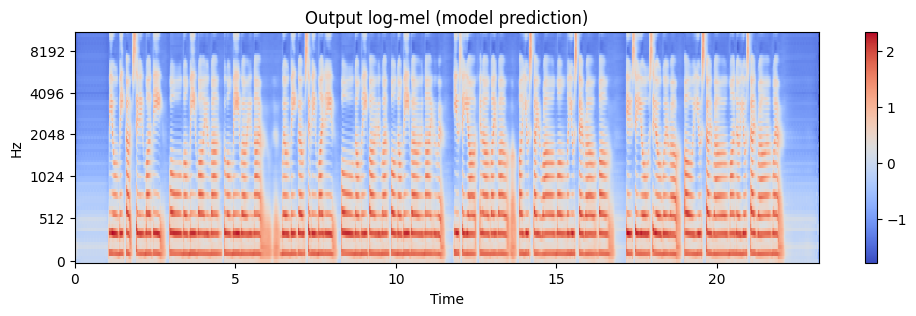

Output mel range: -1.78 to 2.35


In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,3))
librosa.display.specshow(mel_out_norm.T, sr=22050, hop_length=256, x_axis='time', y_axis='mel')
plt.colorbar()
plt.title("Output log-mel (model prediction)")
plt.show()
print(f"Output mel range: {mel_out_norm.min():.2f} to {mel_out_norm.max():.2f}")

## 8. (Optional) Higher-Quality Vocoding with Parallel Wave GAN

Griffin-Lim is fast but introduces artifacts. For best results install and use the PWG vocoder as described in the repo README.

```bash
pip install parallel-wavegan
```

Then download the [arctic_slt_parallel_wavegan.v1](https://drive.google.com/open?id=1xG9CmSED2TzFdklD6fVxzf7kFV2kPQAJ) checkpoint and run:

In [ ]:
!pip install parallel-wavegan

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.2/100.2 kB 5.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.5/87.5 kB 9.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.8/43.8 kB 4.8 MB/s eta 0:00:00
  Created wheel for parallel-wavegan: filename=parallel_wavegan-0.6.1-py3-none-any.whl size=106235 sha256=052ad3bc0faf1f6f3ea8aadb252855549513c7230ace9857d8ee771eddc6e6c6
  Stored in directory: /root/.cache/pip/wheels/fe/4e/98/fbd8f6edcc796c3e785f94c81e56f71e3c3333248e0402ba13
Successfully built parallel-wavegan


In [ ]:
# ── PWG vocoder (run only if you have the PWG checkpoint) ───────────────────
PWG_CKPT = "arctic_slt_parallel_wavegan.v1/checkpoint-400000steps.pkl"  # ← set path
PWG_CONFIG = "arctic_slt_parallel_wavegan.v1/config.yml"                # ← set path

if os.path.exists(PWG_CKPT):
    from parallel_wavegan.utils import load_model as load_pwg
    import yaml, torch

    with open(PWG_CONFIG) as f:
        pwg_config = yaml.safe_load(f)

    pwg_model = load_pwg(PWG_CKPT, config=pwg_config)
    pwg_model = pwg_model.to(DEVICE).eval()

    # De-normalise output mel
    log_mel_out = mel_out_norm * sp_std + sp_mean          # (T, 80)
    mel_tensor  = torch.FloatTensor(log_mel_out.T).unsqueeze(0).to(DEVICE)  # (1, 80, T)

    with torch.no_grad():
        audio_pwg = pwg_model.inference(mel_tensor.squeeze(0).T).squeeze().cpu().numpy()

    OUTPUT_PWG = "output_speech_pwg.wav"
    sf.write(OUTPUT_PWG, audio_pwg, SR)
    print("\n🗣️  Output (PWG vocoder):")
    display(Audio(OUTPUT_PWG, rate=SR))
else:
    print(f"PWG checkpoint not found at '{PWG_CKPT}'. Skipping.")
    print("Download it from: https://drive.google.com/open?id=1xG9CmSED2TzFdklD6fVxzf7kFV2kPQAJ")

### Download Parallel Wave Gan Checkpoint

In [ ]:
import gdown
import os

PWG_FOLDER_ID = "1xG9CmSED2TzFdklD6fVxzf7kFV2kPQAJ" # from the provided link
PWG_LOCAL_DIR = "arctic_slt_parallel_wavegan.v1"

os.makedirs(PWG_LOCAL_DIR, exist_ok=True)

if not os.listdir(PWG_LOCAL_DIR):  # only download if empty
    print(f"Downloading Parallel Wave Gan checkpoint to {PWG_LOCAL_DIR}...")
    gdown.download_folder(
        id=PWG_FOLDER_ID,
        output=PWG_LOCAL_DIR,
        quiet=False,
        use_cookies=False
    )
    print("✅ PWG Checkpoints downloaded.")
else:
    print(f"PWG Checkpoints already present in {PWG_LOCAL_DIR}:", os.listdir(PWG_LOCAL_DIR))

# Update PWG_CKPT and PWG_CONFIG to the correct paths
PWG_CKPT = os.path.join(PWG_LOCAL_DIR, "checkpoint-400000steps.pkl")
PWG_CONFIG = os.path.join(PWG_LOCAL_DIR, "config.yml")

print(f"PWG_CKPT set to: {PWG_CKPT}")
print(f"PWG_CONFIG set to: {PWG_CONFIG}")

Retrieving folder contents


Retrieving folder 1uDxUh8spAAzq9jTbi71sYFtlJLW1b0h- checkpoint-400000steps
Retrieving folder 1gdp7frgO9FUJewMOuOczD6jI_bfTo8eB dev
Retrieving folder 1HlbKiCnKbkrF5kbPKV-srvsvyXLsVybu q
Processing file 1ntUdtM9pnbEJ1AdVc9KLp6KsbdXYgcgb decode.log
Processing file 1dRbh9PYnhX-HRkbQN-kdjjQGmZzeYCtD decode.sh
Processing file 1k8jkJ7qlLzmVZ7Nw-imn-5hnJ-Y6KnVA decode.log
Processing file 1jsmAs_E8IqCuJ2_85YazzLtyqoHx3z-m slt_arctic_b0340_gen.wav
Processing file 1n1vuZRdNDf2zjAX1nmI8nBVlYmjS6d1O slt_arctic_b0341_gen.wav
Processing file 18fJdkd9XKAr_9lgMDZBBmr6y9AGRsozh slt_arctic_b0342_gen.wav
Processing file 19URTDTfcwPqm0m5HEs3GN2IR7anMBsBm slt_arctic_b0343_gen.wav
Processing file 1Ud5Cl2yGsFWzxgg-gVleSdYrx-YHQHXJ slt_arctic_b0344_gen.wav
Processing file 1dO6D5440D2jkc2Pvhg5FeGX2z8vfGYzY slt_arctic_b0345_gen.wav
Processing file 18YV6vRkFzdrJ_28mCibEc3MhEAuFn8LO slt_arctic_b0346_gen.wav
Processing file 1Vt77IRR98JZOwXVsZJ5VyC7i5_XdRaK3 slt_arctic_b0347_gen.wav
Processing file 1tFuIOY7AlYG7-zLa

FolderContentsMaximumLimitError: The gdrive folder with url: https://drive.google.com/drive/folders/1gdp7frgO9FUJewMOuOczD6jI_bfTo8eB?hl=en has more than 50 files, gdrive can't download more than this limit.

## 9. Visualise Mel-Spectrograms

Compare the input singing mel vs. the predicted speech mel.

In [ ]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 1, figsize=(14, 6))

# Clip both to the same time length for a cleaner comparison
T_disp = min(mel_sing.shape[0], mel_out_norm.shape[0], 600)

axes[0].imshow(
    mel_sing[:T_disp].T, aspect="auto", origin="lower",
    cmap="magma", interpolation="nearest"
)
axes[0].set_title("Input: Singing Mel-Spectrogram", fontsize=13)
axes[0].set_ylabel("Mel bin")
axes[0].set_xlabel("Frame")

axes[1].imshow(
    mel_out_norm[:T_disp].T, aspect="auto", origin="lower",
    cmap="magma", interpolation="nearest"
)
axes[1].set_title("Output: Predicted Speech Mel-Spectrogram", fontsize=13)
axes[1].set_ylabel("Mel bin")
axes[1].set_xlabel("Frame")

plt.tight_layout()
plt.savefig("mel_comparison.png", dpi=150)
plt.show()
print("Plot saved to mel_comparison.png")

## 10. Download Output

Download the converted audio to your local machine (Colab only).

In [ ]:
try:
    from google.colab import files
    files.download(OUTPUT_PATH)
except ImportError:
    print(f"Not running in Colab. Your file is at: {os.path.abspath(OUTPUT_PATH)}")

---
## Notes & Tips

- **Best audio quality:** Use the Parallel Wave GAN vocoder (Section 8) instead of Griffin-Lim.
- **Inference mode:** `no_dur` is recommended. `dur` uses the alignment model and may fail with poorly-trained checkpoints.
- **Long audio:** The model can run OOM on GPU for clips longer than ~2 minutes at 22 kHz. Either truncate or run on CPU.
- **Input format:** Any format readable by `librosa` (`.wav`, `.mp3`, `.flac`, etc.) works. Mono is assumed; stereo is automatically mixed down.
- **Paper:** Huang & Benetos, *Singing to speech conversion with generative flow*, EURASIP JASMP 2025. [DOI: 10.1186/s13636-025-00400-x](https://doi.org/10.1186/s13636-025-00400-x)